# Denoising

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pywt
import cv2
import sys
import os
from GUIA1 import fft_analysis as ffta
from GUIA2 import texturas
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from IPython.display import display

## Eliminacion de ruido por analisis de fourier 

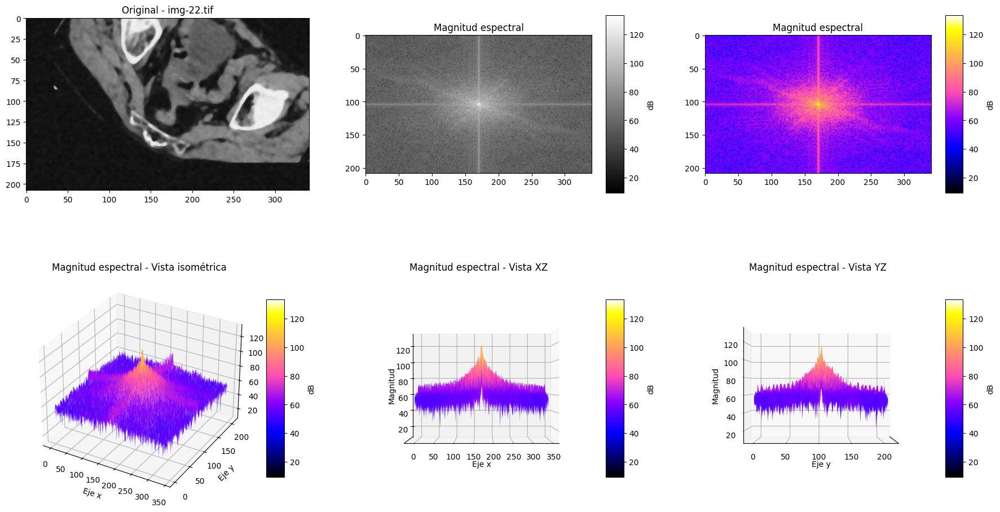

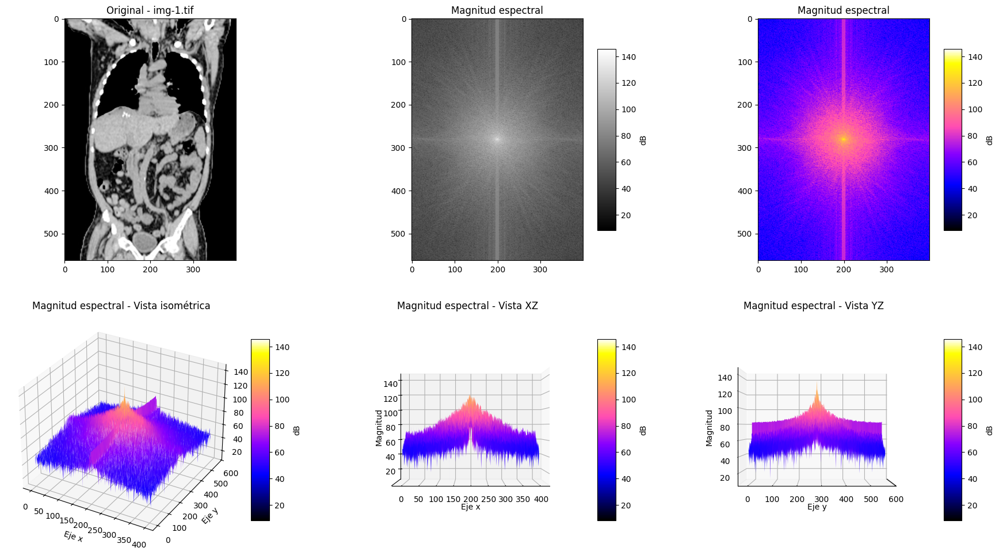

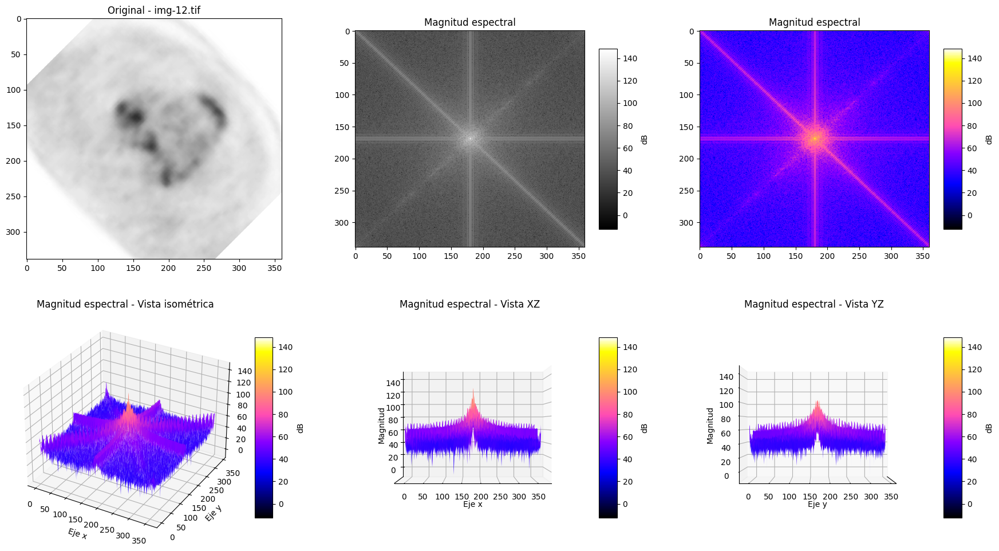

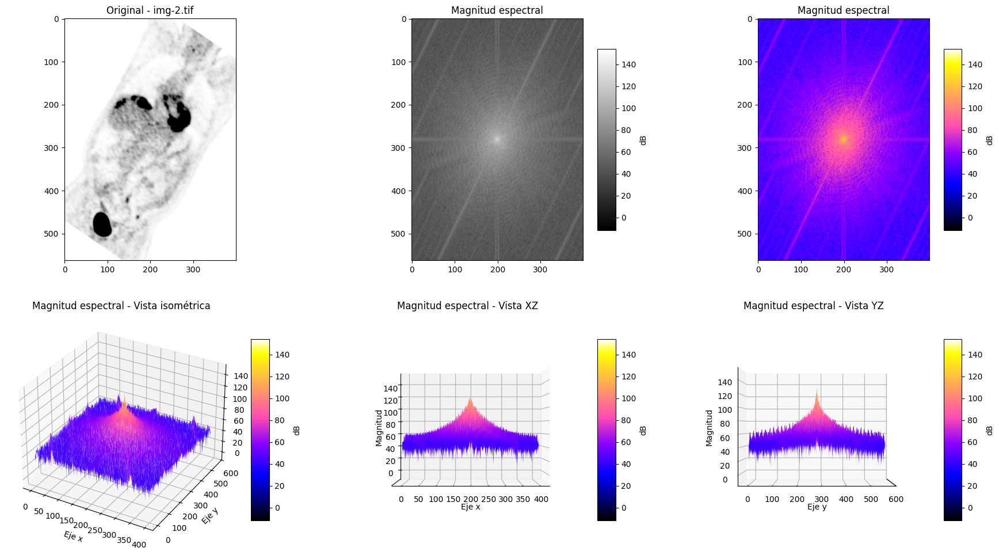

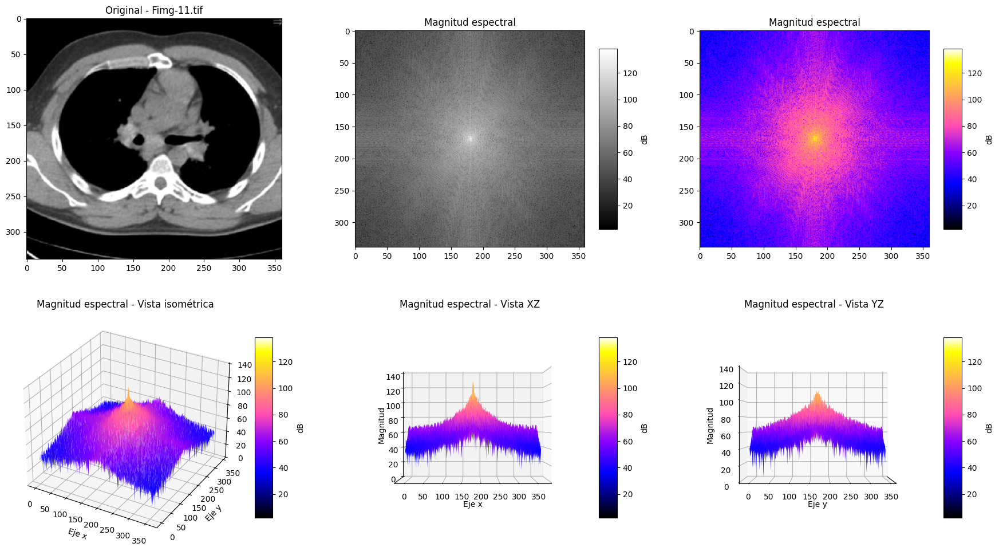

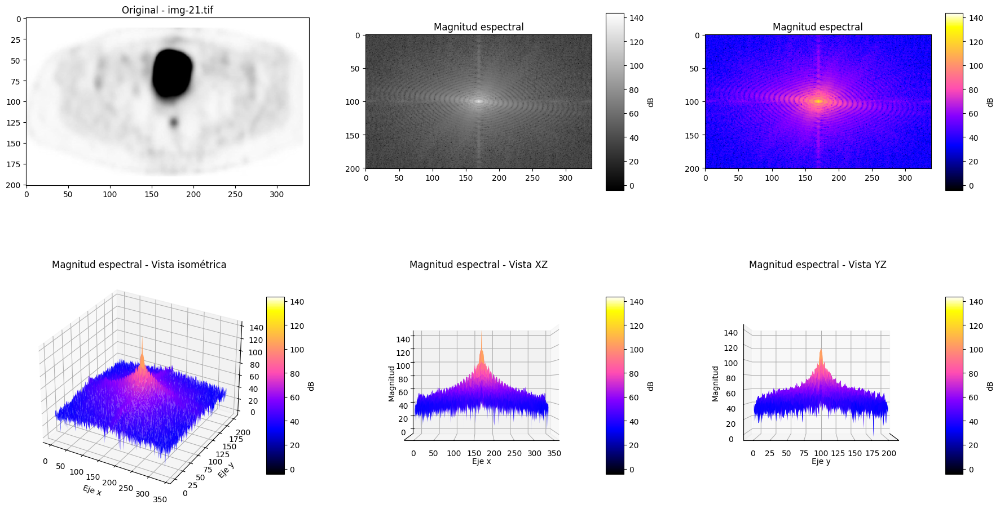

In [17]:
base_dir = 'PAIByB-7'
paths = []
for name in os.listdir(base_dir):
    img_path = os.path.join(base_dir, name)
    paths.append(img_path)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    ffta.cr8FFTimgsPlots(img, name)

Elegimos los umbrales para las frecuencias que se quieren eliminar

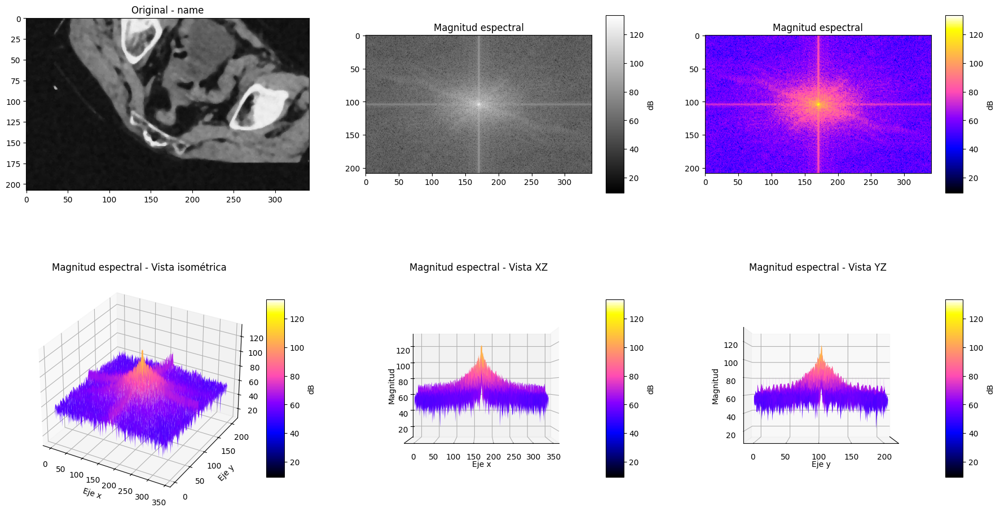

Output()

In [18]:
# Sliders for thresholding from 0 to 255
output_dir = 'denoised_7'

def denoise_with_threshold(img_path, low, high):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    noise_estim = ffta.cr8FFTNoiseEstimPlots(img, [low, high], f"{img_path.split('/')[-1]}")
    denoised = ffta.cr8FFTDenoisingPlots(img, [low, high], f"{img_path.split('/')[-1]}")
    cv2.imwrite(f"{output_dir}/{img_path.split('/')[-1]}", denoised)


# Create sliders for each image
img_path = 'PAIByB-7/img-22.tif'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
ffta.cr8FFTimgsPlots(img)

# Create sliders
low = widgets.IntSlider(min=0, max=255, step=1, value=70, description='Low threshold', layout=widgets.Layout(width='500px'))
high = widgets.IntSlider(min=0, max=255, step=1, value=120, description='High threshold', layout=widgets.Layout(width='500px'))

# Create UI and output
ui = widgets.VBox([low, high])
out = widgets.interactive_output(denoise_with_threshold, {'img_path': fixed(img_path), 'low': low, 'high': high})

# Display UI and output
display(ui, out)


Ecualizamos el histograma utilizando CLAHE

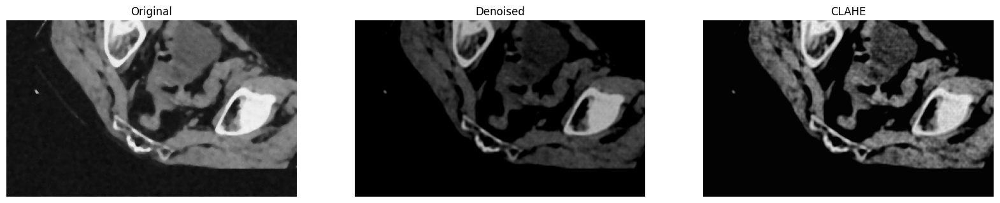

In [23]:
denoised_22 = cv2.imread('denoised_7/img-22.tif', cv2.IMREAD_GRAYSCALE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
denoised_clahe_22 = clahe.apply(denoised_22)

fig, axs = plt.subplots(1,3, figsize=(20, 5))

axs[0].imshow(img, cmap='gray', vmin=0, vmax=255)
axs[0].set_title('Original')
axs[0].set_axis_off()

axs[1].imshow(denoised_22, cmap='gray', vmin=0, vmax=255)
axs[1].set_title('Denoised')
axs[1].set_axis_off()

axs[2].imshow(denoised_clahe_22, cmap='gray', vmin=0, vmax=255)
axs[2].set_title('CLAHE')
axs[2].set_axis_off()

plt.show()

In [24]:
# Guardamos la denoiseada y ecualizada
cv2.imwrite('denoised_7/img-22-denoised.tif', denoised_clahe_22)

True

### Eliminacion de ruido por filtros de Gabor

In [46]:
# Create sliders for lambda and theta, and apply gabor filters using texturas.imagen_gabor
img_path = 'PAIByB-7/img-12.tif'

def apply_gabor_filter(img_path, lambd):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    # Apply gabor filters for theta=0, 45, 90, 135
    gabor_0 = texturas.imagen_gabor(img, lambd=lambd, theta=0)
    gabor_45 = texturas.imagen_gabor(img, lambd=lambd, theta=np.pi/4)
    gabor_90 = texturas.imagen_gabor(img, lambd=lambd, theta=np.pi/2)
    gabor_135 = texturas.imagen_gabor(img, lambd=lambd, theta=3*np.pi/4)
    gabor_images = [gabor_0, gabor_45, gabor_90, gabor_135] 
    
    # Plot gabor filter images
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    for i, gabor_img in enumerate(gabor_images):
        axs[i].imshow(gabor_img, cmap='gray', vmin=0, vmax=255)
        axs[i].set_title(f'Gabor theta={i*45}°')
        axs[i].set_axis_off()
    
    # Finally, plot original image vs. original image - gabor filters
    filtered_img = img - gabor_0 - gabor_45 - gabor_90 - gabor_135
    fig, axs = plt.subplots(1, 2, figsize=(20, 5))
    axs[0].imshow(img, cmap='gray', vmin=0, vmax=255)
    axs[0].set_title('Original')
    axs[0].set_axis_off()
    axs[1].imshow(filtered_img, cmap='gray', vmin=0, vmax=255)
    axs[1].set_title('Original menos Gabor filters')
    axs[1].set_axis_off()
    plt.show()

lambda_slider = widgets.FloatSlider(min=0.01, max=10, step=0.01, value=1, description='Lambda', layout=widgets.Layout(width='500px'))

ui = widgets.VBox([lambda_slider])
out = widgets.interactive_output(apply_gabor_filter, {'img_path': fixed(img_path), 'lambd': lambda_slider})

display(ui, out)

Output()

### Probamos con una mascara hecha a mano

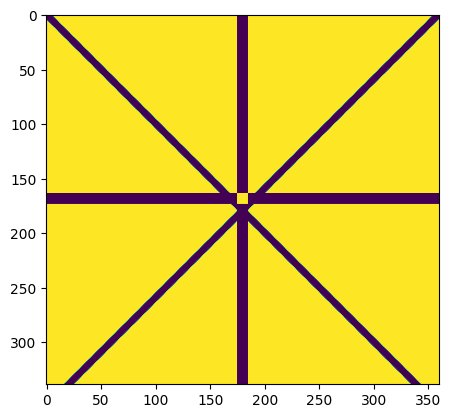

In [12]:
img_path = 'PAIByB-7/img-12.tif'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
img_spectra = ffta.calculate2DFT(img)
img_ms = ffta.calculateMagnitudSpectrum(img)
mask = np.ones_like(img_ms)
rows, cols = img_ms.shape
epsilon = 1e-2
width = 5

# Kill frequencies in the horizontal and vertical
mask[rows//2-width:rows//2+width, :] = epsilon
mask[:, cols//2-width:cols//2+width] = epsilon 

# Kill frequencies in the diagonals
for i in range(rows):
    for j in range(cols):
        if abs(i - j) < width or abs(i + j - (cols - 1)) < width:
            mask[i, j] = epsilon 

# We also want the center of the spectra to stay unchanged
mask[rows//2-width:rows//2+width, cols//2-width:cols//2+width] = 1

plt.imshow(mask)

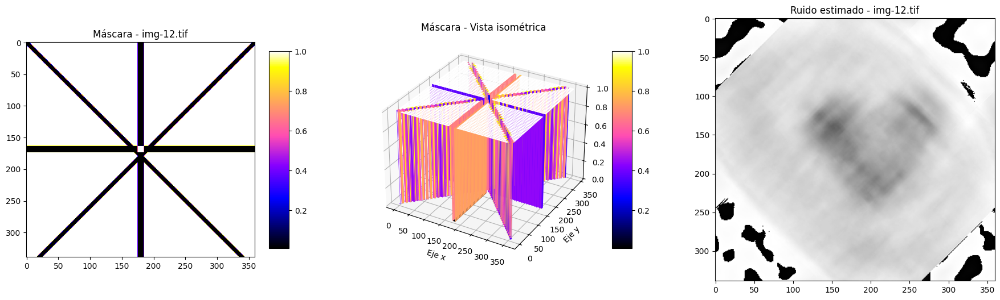

In [13]:
# Denoiseo con la mascara hecha a mano
name = img_path.split('/')[-1]
noise = ffta.getNoiseFFT(img, mask)

min_mk = np.min(mask)
max_mk = np.max(mask)

alto, ancho = np.shape(mask)

X = np.arange(ancho)
Y = np.arange(alto)
X,Y = np.meshgrid(X,Y)
Z = mask

# 0º - Figure set-up
fig = plt.figure(figsize=(22,6))

# 1º subplot
ax = fig.add_subplot(1, 3, 1)
color_mk = ax.imshow(mask,vmin=min_mk,vmax=max_mk,cmap='gnuplot2')
ax.set_title(f'Máscara - {name}')

# 2º subplot
ax = fig.add_subplot(1, 3, 2, projection='3d')
surf1 = ax.plot_surface(X, Y, Z,vmin=min_mk,vmax=max_mk,cmap='gnuplot2')
ax.set_title("Máscara - Vista isométrica")
ax.set_xlabel('Eje x')
ax.set_ylabel('Eje y')

# 3º subplot
ax = fig.add_subplot(1, 3, 3)
gray_ms = ax.imshow(noise,vmin=0,vmax=255,cmap='gray')
ax.set_title(f"Ruido estimado - {name}")

#Colorbars
fig.colorbar(color_mk,shrink=0.75,aspect=10)
fig.colorbar(surf1,shrink=0.75,aspect=10)

plt.show()

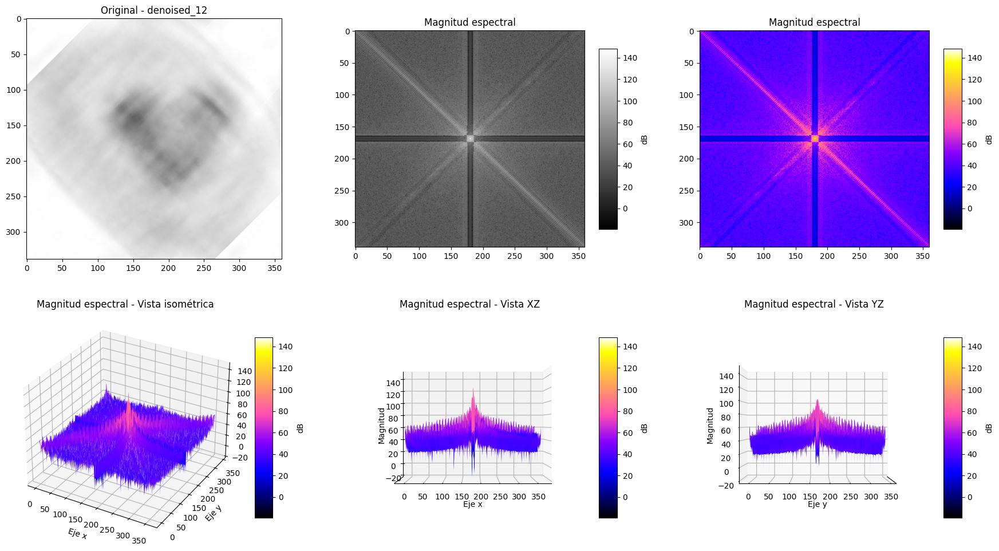

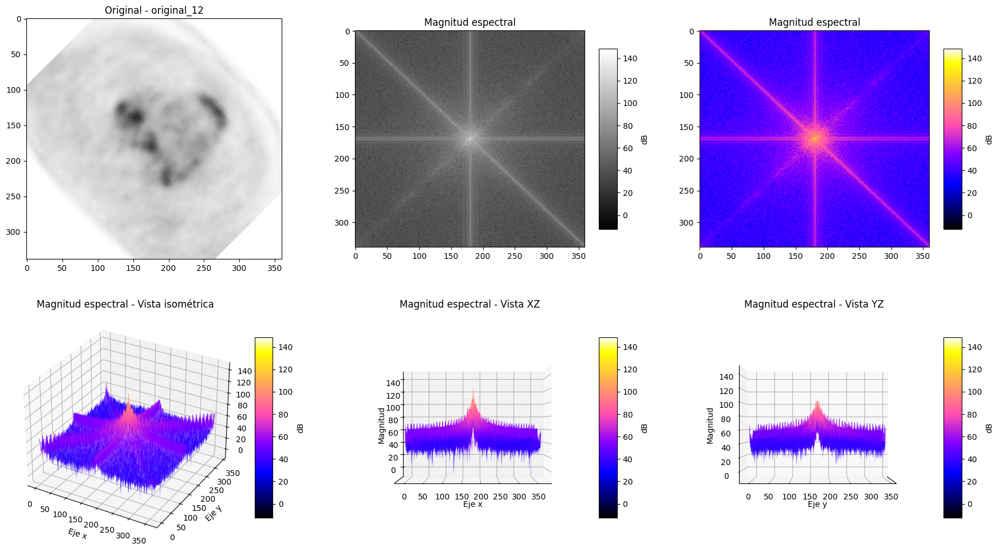

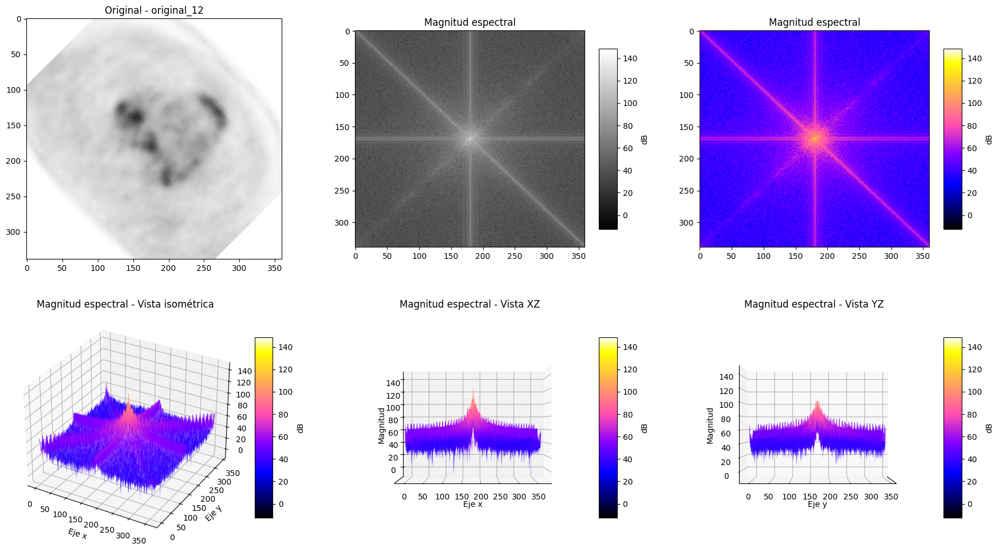

In [14]:
denoised_12 = ffta.calculate2DInverseFT(img_spectra*mask)
ffta.cr8FFTimgsPlots(denoised_12, 'denoised_12')
ffta.cr8FFTimgsPlots(img, 'original_12')

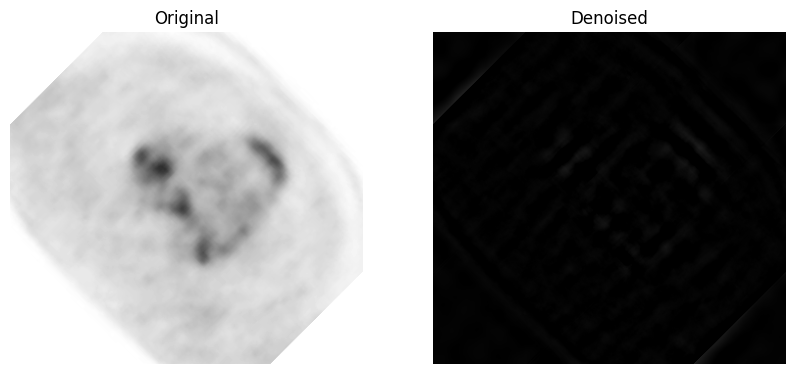

In [82]:
denoised_12 = ffta.calculate2DInverseFT(img_spectra*mask)
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img, cmap='gray', vmin=0, vmax=255)
axs[0].set_title('Original')
axs[0].set_axis_off()
axs[1].imshow(denoised_12, cmap='gray', vmin=0, vmax=255)
axs[1].set_title('Denoised')
axs[1].set_axis_off()
plt.show()

### Eliminacion de ruido por wavelets

In [3]:
from GUIA1 import test_wavelet as tw

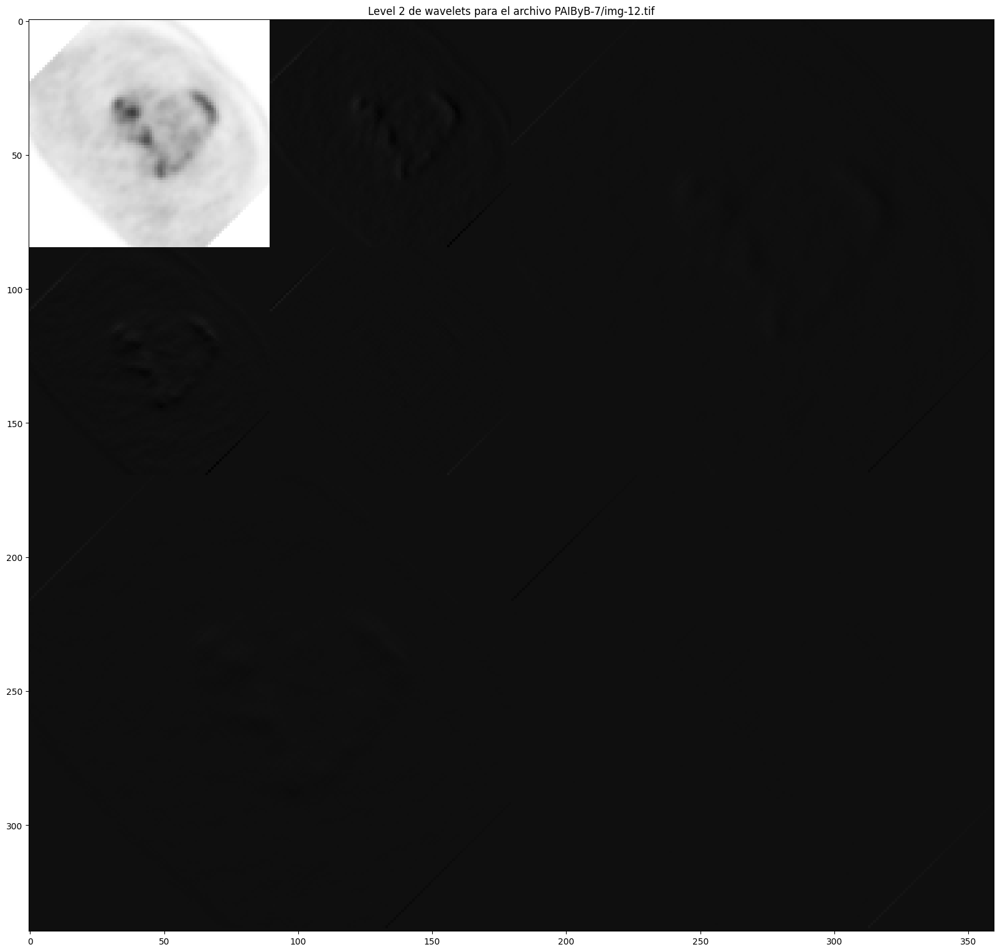

In [7]:
imagen, coeffs = tw.Wavelet2(img_path, Plot_reconstructed_imagestructed=False)

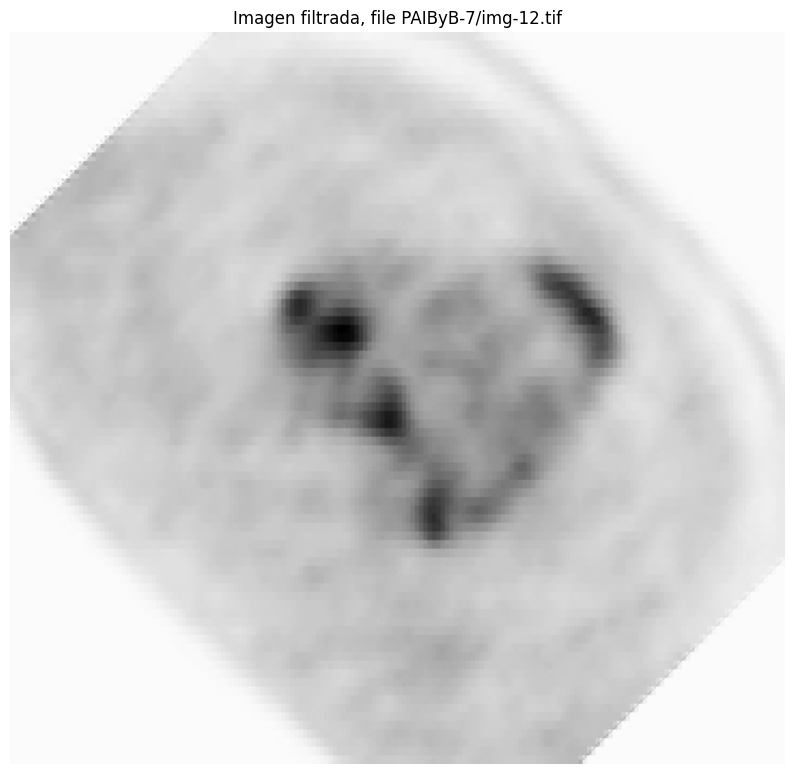

(array([[254.99997, 254.99997, 254.99997, ..., 254.99997, 254.99997,
         254.99997],
        [254.99997, 254.99997, 254.99997, ..., 254.99997, 254.99997,
         254.99997],
        [254.99997, 254.99997, 254.99997, ..., 254.99997, 254.99997,
         254.99997],
        ...,
        [254.99997, 254.99997, 254.99997, ..., 254.99997, 254.99997,
         254.99997],
        [254.99997, 254.99997, 254.99997, ..., 254.99997, 254.99997,
         254.99997],
        [254.99997, 254.99997, 254.99997, ..., 254.99997, 254.99997,
         254.99997]], dtype=float32),
 [array([[1019.9999, 1019.9999, 1019.9999, ..., 1019.9999, 1019.9999,
          1019.9999],
         [1019.9999, 1019.9999, 1019.9999, ..., 1019.9999, 1019.9999,
          1019.9999],
         [1019.9999, 1019.9999, 1019.9999, ..., 1019.9999, 1019.9999,
          1019.9999],
         ...,
         [1019.9999, 1019.9999, 1019.9999, ..., 1019.9999, 1019.9999,
          1019.9999],
         [1019.9999, 1019.9999, 1019.9999, ..., 

In [17]:
list_coeffs =[[1],[0,1,1],[0,0,1]]
tw.filtrado(list_coeffs, img_path, coeffs, level=2)

### Volvemos a las raices: filtrado espacial con kernels

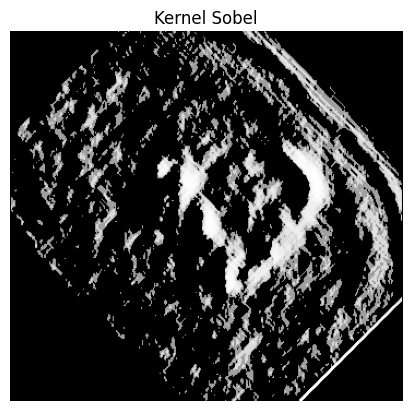

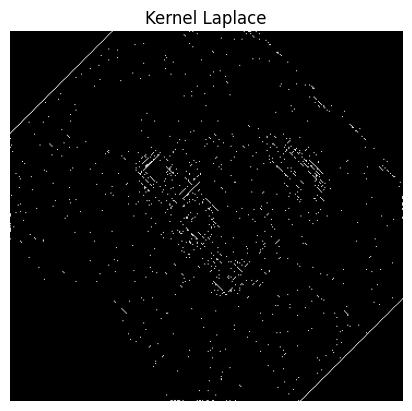

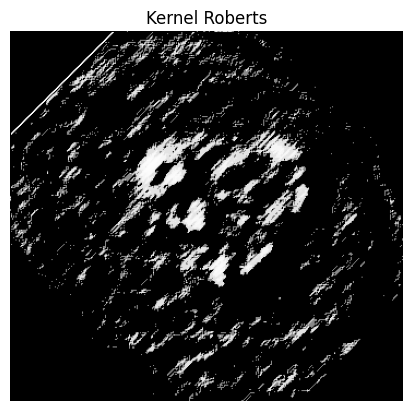

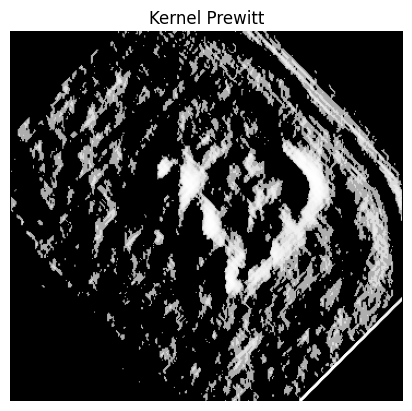

In [20]:
kernel_sobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])/8
kernel_laplace = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])/8
kernel_roberts = np.array([[1, 0], [0, -1]])/2
kernel_prewitt = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])/6

kernels = [kernel_sobel, kernel_laplace, kernel_roberts, kernel_prewitt]
kernel_names = ['Sobel', 'Laplace', 'Roberts', 'Prewitt']
filtered_images = []

for kernel, name in zip(kernels, kernel_names):
    # Aplicamos el filtro usando cv2
    filtered_img = cv2.filter2D(img, -1, kernel)
    # Ecualizamos el histograma
    filtered_img = cv2.equalizeHist(filtered_img)
    # Mostramos la imagen filtrada
    plt.imshow(filtered_img, cmap='gray', vmin=0, vmax=255)
    plt.title('Filtro aplicado')
    plt.axis('off')
    plt.title(f'Kernel {name}')
    plt.show()    
    
    filtered_images.append(filtered_img)


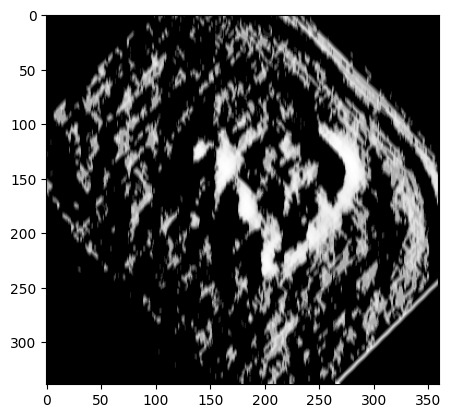

In [22]:
# Suaviamos y oramos al dios turco
kernel_gaussian = cv2.getGaussianKernel(5, 5)
smooth_prewitt = cv2.filter2D(filtered_images[-1], -1, kernel_gaussian)
plt.imshow(smooth_prewitt, cmap='gray', vmin=0, vmax=255)